## Plot SWOT data for a new region

Instructions to get SWOT data:
1. Get an [AVISO ftp account](https://www.aviso.altimetry.fr/en/data/data-access/ftp.html)
2. Create an rclone folder called `aviso` that links to the AVISO ftp
3. Find the SWOT pass numbers using this [jupyter notebook](https://mybinder.org/v2/gh/CNES/search_swot/HEAD?labpath=notebook.ipynb) from the [PO.DAAC cookbook](https://podaac.github.io/tutorials/quarto_text/SWOT.html)
4. Download SWOT data using a shell script that looks like this:
   
```shell
####
# Science
###
# L3 v2.0.1 smoothed 2 km data
remote=aviso:/swot_products/l3_karin_nadir/l3_lr_ssh/v2_0_1/Expert/
local=~/data/SWOT/l3_karin_nadir_v2_0_1

## Exmouth
strings='131 062'
#
## Loop through the list
for string in $strings; do
  echo "$string"
  include="cycle_0*/*Expert_*_$string*.nc" # Browse
  echo $include
  rclone copy -P --checkers 1 --transfers 2 $remote --include $include $local
done
```


In [1]:
import xarray as xr
import matplotlib.pyplot as plt
from glob import glob
import numpy as np
from datetime import datetime

In [5]:
def convert_swot_l3(ncfiles, area):#读取一批 SWOT L3 NetCDF 文件 → 合并 → 裁剪到指定经纬度区域 → 返回一个子集数据集
    
    # Merge all dataset
    def add_time_dim(xda):
        #xda = xda.expand_dims(satpass = [datetime.now()])
        xda = xda.expand_dims(satpass = [xda.time.mean().values])
        return xda
    
    drop_vars=['i_num_line','i_num_pixel']
    dsall = xr.open_mfdataset(ncfiles, preprocess=add_time_dim, 
                              drop_variables=drop_vars,
                             )

    # Subsample the area
    ds = dsall
    
    selection = ( #是一个布尔掩码，筛选出符合 area 范围的经纬度点。
        (ds.longitude > area[0]) &
        (ds.longitude < area[2]) &
        (ds.latitude > area[1]) &
        (ds.latitude < area[3]))
    selection = selection.compute()
    ds_area = ds.where(selection, drop=True)

    return ds_area

def plot_basemap(ax, xlims, ylims, clevs=[100,200,300,400, 500],fine_contours=False, basedir='/data/' ):
#这个函数负责加载地形（bathymetry）数据 → 在已有的 matplotlib ax 上画等深线（作为地图底图）

    # Load some bathy data
    dsall = xr.open_dataset(f'{basedir}/Bathymetry/GA_WEL_NWS_250m_DEM.nc')
    dsZ = dsall.assign_coords(nx=dsall.X,ny=dsall.Y).sel(nx=slice(xlims[0],xlims[1]), ny=slice(ylims[0], ylims[1]))
    
    c= ax.contour(dsZ['X'],dsZ['Y'],-dsZ['topo'],clevs,colors='k',linewidths=0.5)
    if fine_contours:
        c_= ax.contour(dsZ['X'],dsZ['Y'],-dsZ['topo'],np.arange(0,550,50),colors='0.5',linewidths=0.2)

    ax.set_aspect('equal')  

    del dsZ
    
    return c

In [4]:
version = 'v2_0_1'

region = 'ningaloo'
area =[113, -23, 114.5, -21.5]
area =[113.25, -22.8, 114.25, -21.6]

#satpasses = ['187','465','159','437','131','409','103','118','396','090','368','062','340','034']
satpass = '062' #'131' #

ncfiles = sorted(glob(f'/data/SWOT/l3_karin_nadir_{version}/cycle_0*/*_{satpass}_*.nc'))

print( len(ncfiles), ncfiles[0],)
ds = convert_swot_l3(ncfiles, area)

ds

IndexError: list index out of range

/tmp/ipykernel_399463/3090229848.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,6))


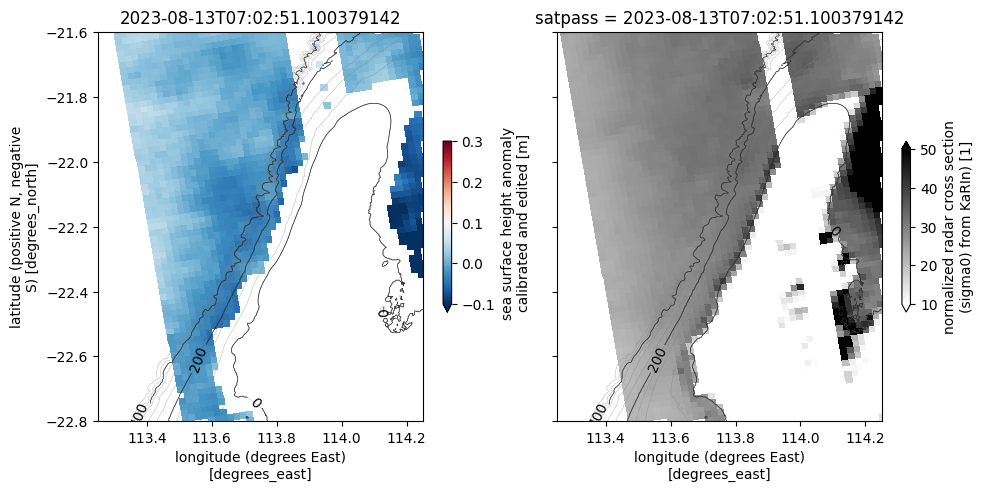

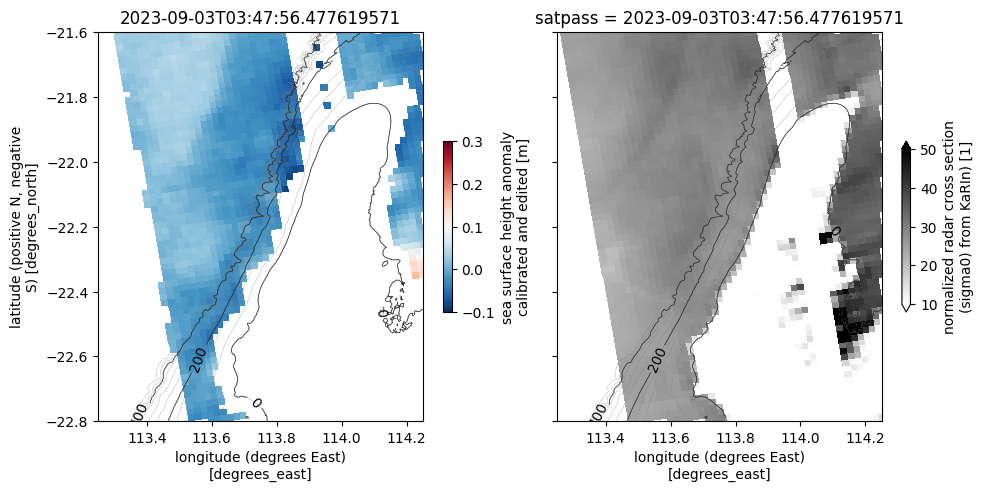

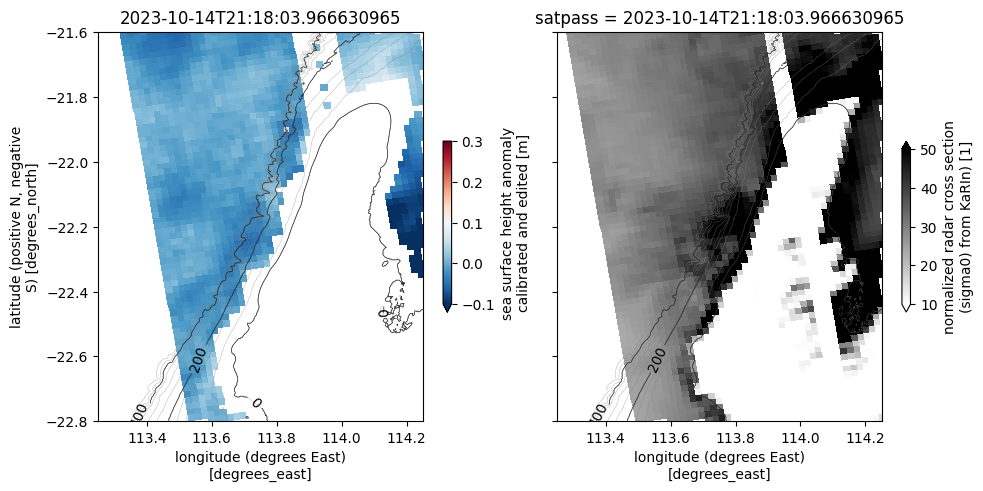

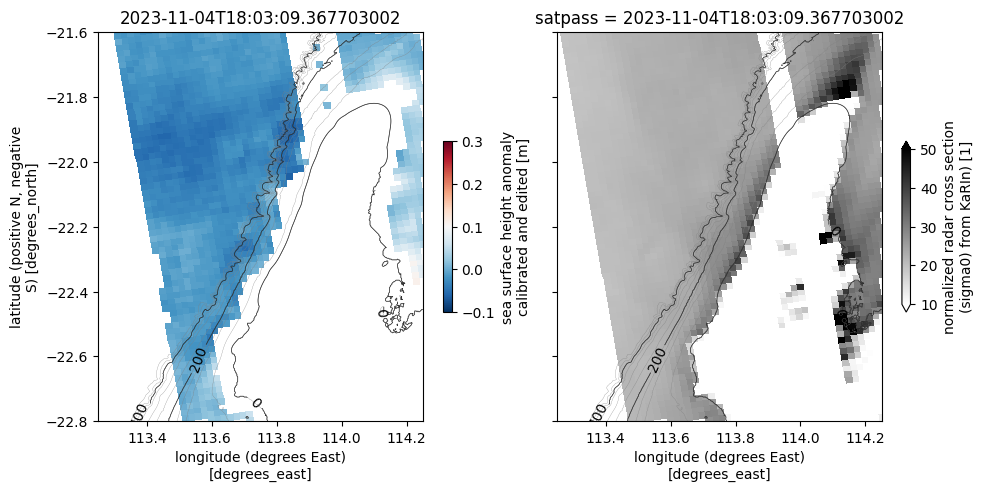

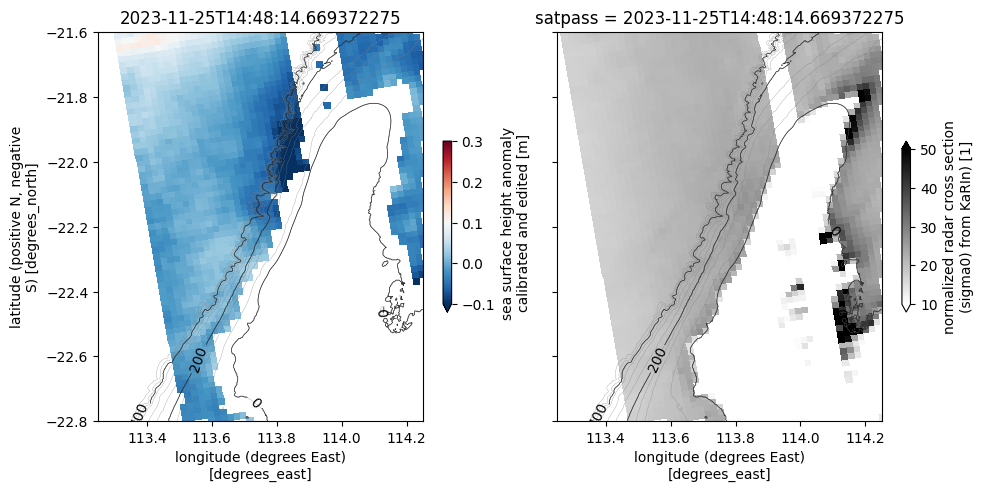

...

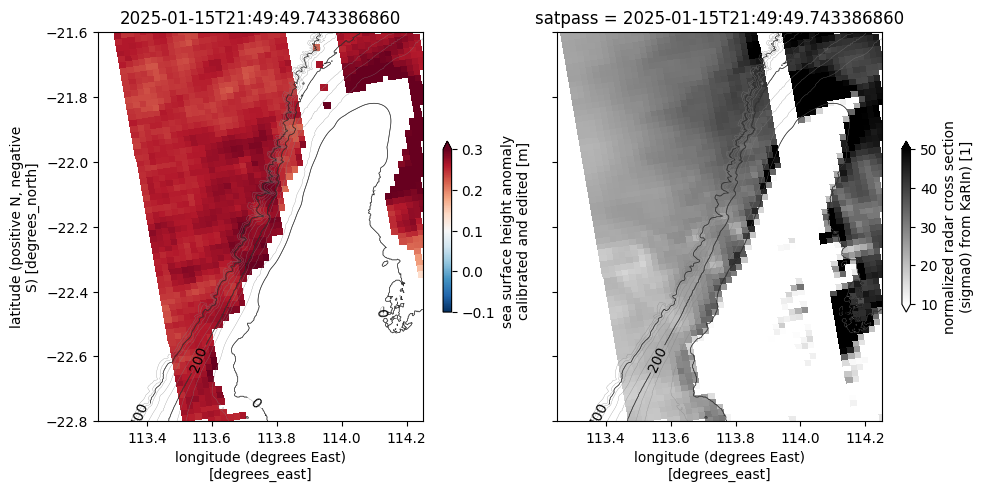

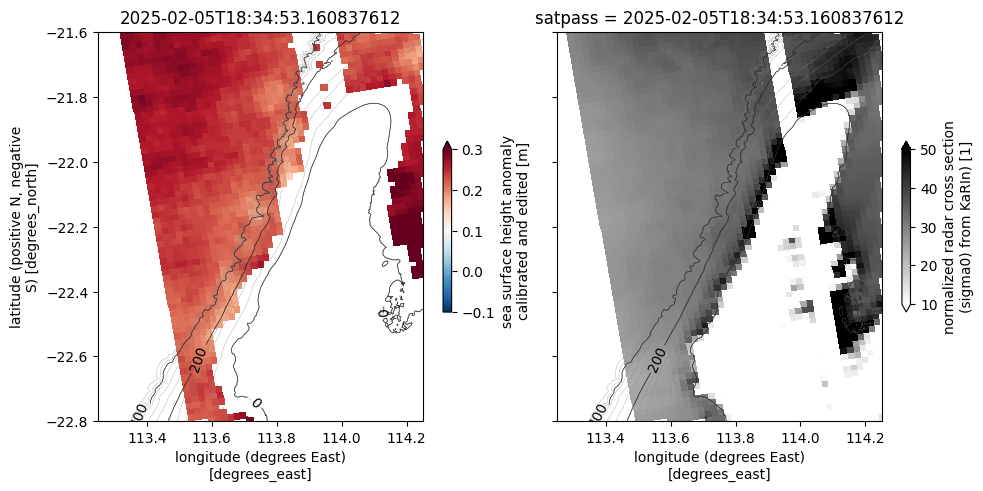

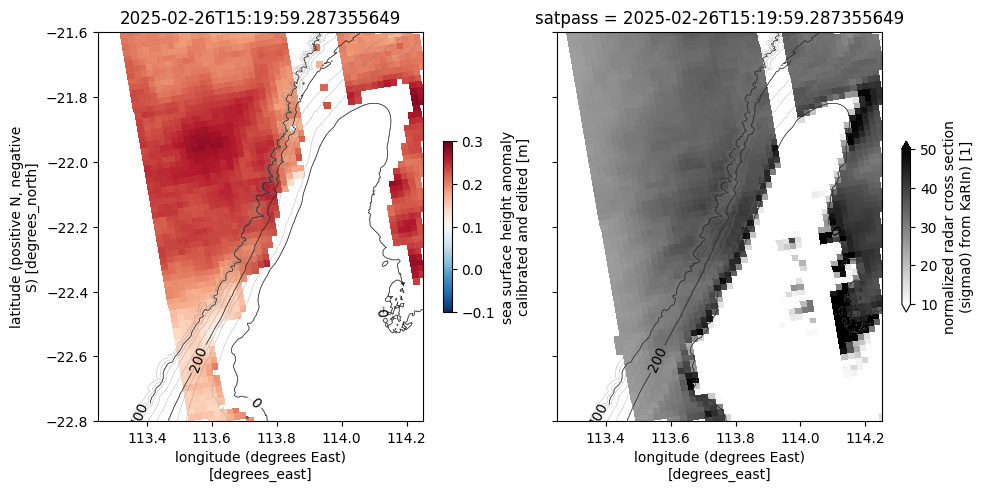

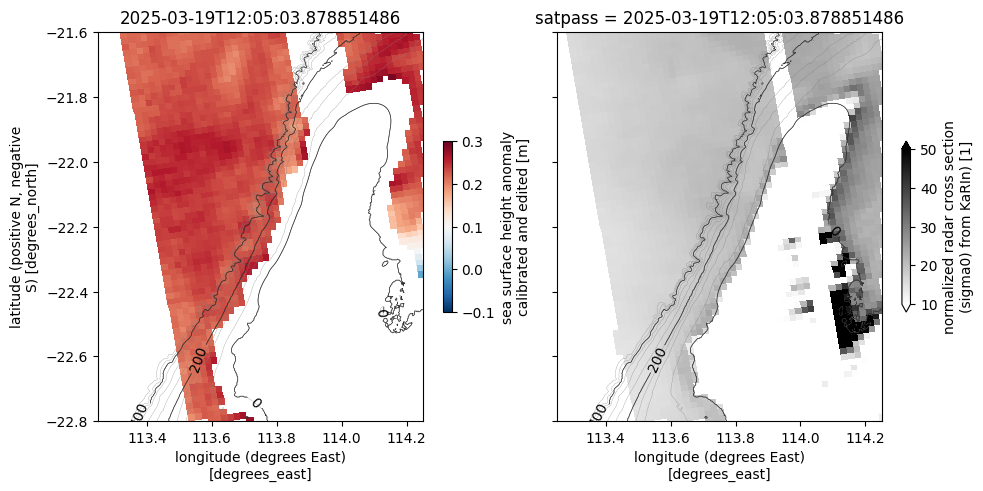

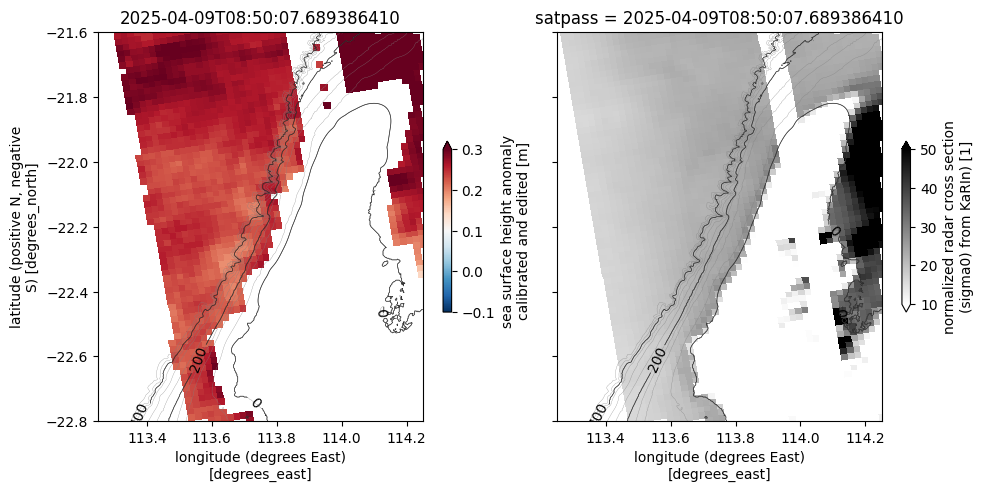

In [10]:
ii = 1
var1 = 'ssha_unfiltered'

x1,y1,x2,y2=area

for ii in range(ds['satpass'].shape[0]):

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,6))
    plot_kwargs = dict(
        x="longitude",
        y="latitude",
        cmap="RdBu_r",
        vmin=-0.1,
        vmax=0.3,
        cbar_kwargs={"shrink": 0.3},)
    ds.isel(satpass=ii)[var1].plot.pcolormesh(ax=ax1, **plot_kwargs)
    c=plot_basemap(ax1, (x1,x2), (y1,y2), clevs=[0,200,400], fine_contours=True)
    
    ax1.set_title(ds.satpass.values[ii])
    ax1.set_xlim(x1,x2)
    ax1.set_ylim(y1,y2)
    plt.clabel(c)
    
    ax1.set_aspect('equal')
    
    # mysst['sea_surface_temperature'].plot(ax=ax2, cmap='cmo.thermal',vmin=21+273, vmax=30+273,cbar_kwargs={"shrink": 0.3,})
    # ax2.pcolormesh(x,y,np.abs(dx+1j*dy), vmin=0, vmax=0.2, cmap='bone_r', alpha=0.5)
    # ax2.quiver(xs, ys, u, v, scale_units='xy', scale=10)
    
    c=plot_basemap(ax2, (x1,x2), (y1,y2), clevs=[0,200,400], fine_contours=True)
    plt.clabel(c)
    
    plot_kwargs = dict(
        x="longitude",
        y="latitude",
        cmap="gray_r",
        vmin=10,
        vmax=50,
        cbar_kwargs={"shrink": 0.3},)
    ds.isel(satpass=ii)['sigma0'].plot.pcolormesh(ax=ax2, **plot_kwargs)
    
    ax2.set_xlim(x1,x2)
    ax2.set_ylim(y1,y2)
    ax2.set_aspect('equal')
    ax2.set_ylabel('')
    ax2.set_yticklabels([])
    
    plt.tight_layout()
    
    outfile = '../FIGURES/SWOT_Karin_l3_{}_{}_{}_{}.png'.\
            format(version, satpass, region, ds.satpass.values[ii].astype(str)[0:10])
    
    plt.savefig(outfile, dpi=150)
    
    outfile

# Apply a 2D filter to the data

In [11]:
from gptide import cov
from gptide import GPtideScipy

from tqdm import tqdm


In [6]:
def kernel_2d_gptide(x, xpr, params):

    eta, lx, ly= params

    # Build the covariance matrix 
    # Note that gptide does a transpose before it passes each matrix
    C = cov.matern32(x[:,1,None], xpr.T[:,1,None].T, ly)
    C *= cov.matern32(x[:,0,None], xpr.T[:,0,None].T, lx)
    C *= eta**2

    return C

    

In [7]:
###
# Covariance model parameters
η_R = 0.05
ℓ_R = 5.0
noise = 0.05
covparams = [η_R, ℓ_R, ℓ_R]
covfunc = kernel_2d_gptide

ss=3

remove_internal_tide = True
remove_tide = False
###
data = ds[var1].values
if remove_internal_tide:
    print('Removing HRET')
    data += ds['internal_tide'].values
if remove_tide:
    print('Removing FES')
    data -= ds['ocean_tide']

# print('removing time mean')
# mu = data.mean(axis=0)
# data -= mu
    
lon = ds['longitude'].values
lat = ds['latitude'].values
time = ds['time'].values
M,N = lon.shape
nt = time.shape[0]

Xm = np.array([lon.ravel(), lat.ravel()]).T

ssh_meso = np.zeros((nt,M,N))

for tt in tqdm(range(nt)):
    yd = data[tt,...].ravel()
    
    X = Xm[::ss,:]
    y = yd[::ss][:,None]
    #print(X.shape)
    
    idx = ~np.isnan(y[:,0])
    
    X = X[idx,:]
    y = y[idx,:]
        
    GP = GPtideScipy(X, Xm, noise, covfunc, covparams)
    ssh_meso[tt,...] = GP(y).reshape([M,N]) #
    #break

# Output data set
ssh = ds[var1]
ssh_meso_da = ssh.copy(deep=True).rename('ssha_mesoscale_oi')
ssh_meso_da[:] = ssh_meso

ssh_meso_da

Removing HRET


100%|██████████| 29/29 [00:03<00:00,  7.58it/s]


<xarray.DataArray 'ssha_mesoscale_oi' (satpass: 29, num_lines: 74,
                                       num_pixels: 51)> Size: 876kB
dask.array<setitem, shape=(29, 74, 51), dtype=float64, chunksize=(1, 74, 51), chunktype=numpy.ndarray>
Coordinates:
  * satpass    (satpass) datetime64[ns] 232B 2023-08-13T07:02:51.100379142 .....
    latitude   (num_lines, num_pixels) float64 30kB -21.46 -21.46 ... -22.91
    longitude  (num_lines, num_pixels) float64 30kB 114.2 114.2 ... 113.5 113.5
Dimensions without coordinates: num_lines, num_pixels
Attributes:
    comment:        Height of the sea surface anomaly with all corrections ap...
    long_name:      sea surface height anomaly calibrated and edited
    standard_name:  sea_surface_height_above_reference_ellipsoid
    units:          m

/tmp/ipykernel_399463/1187220781.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,6))


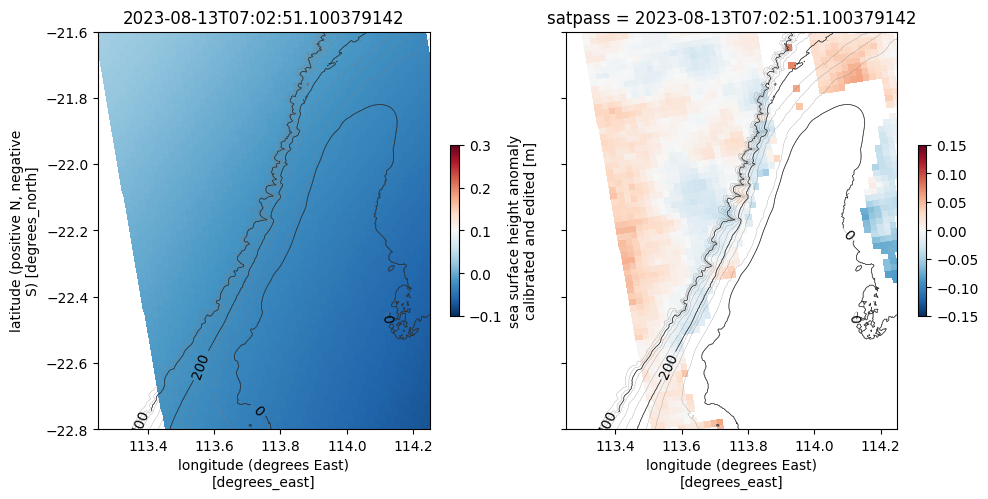

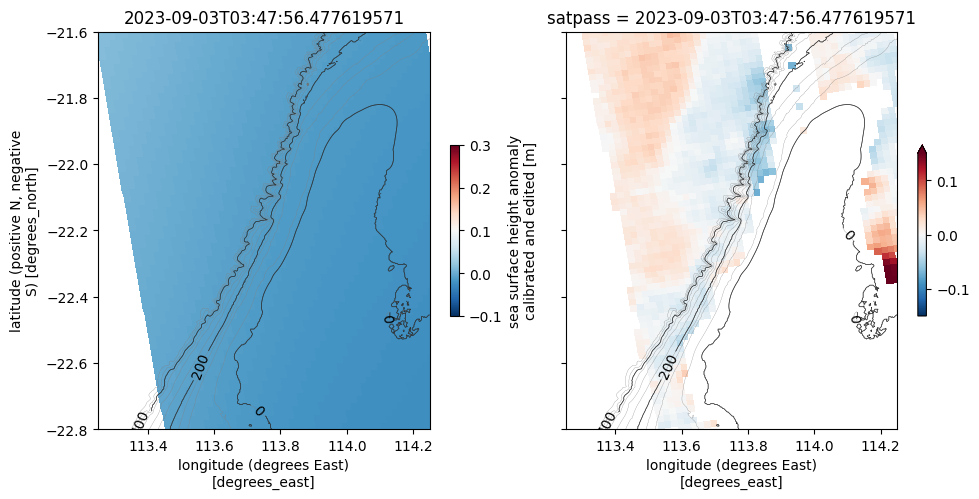

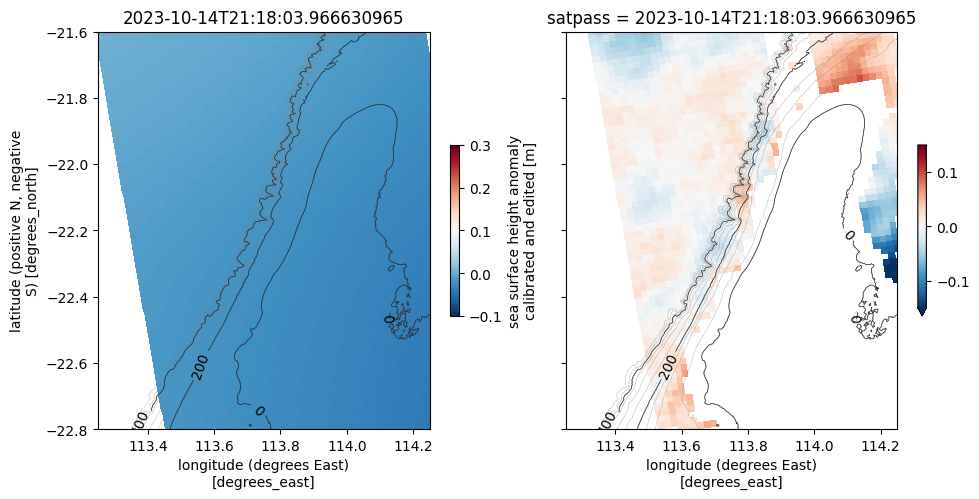

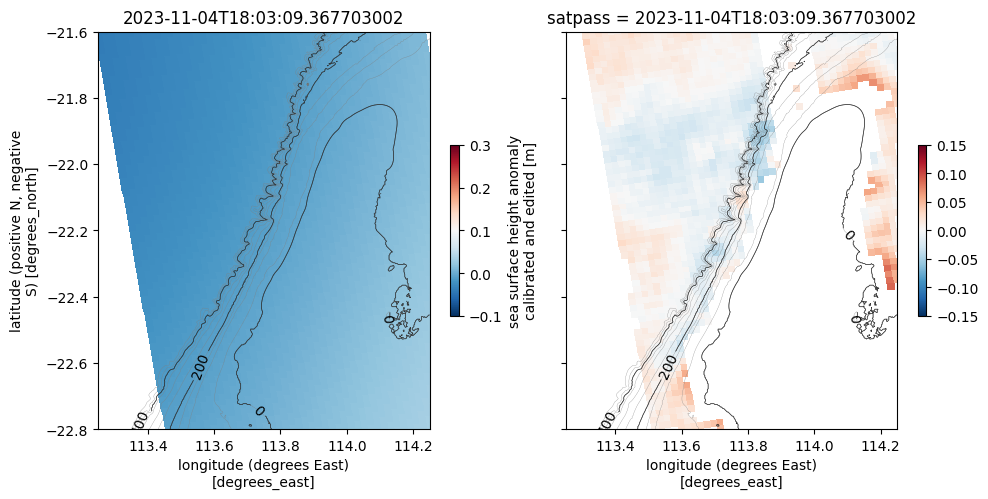

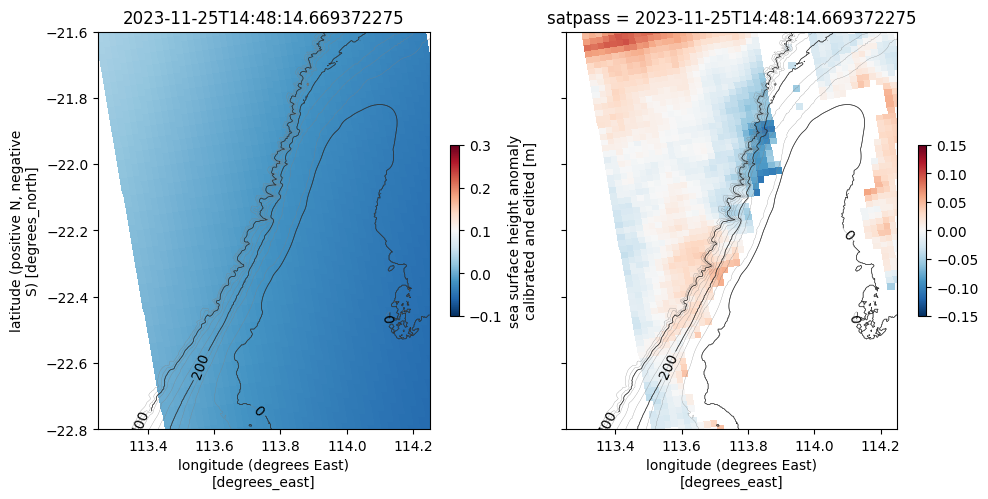

...

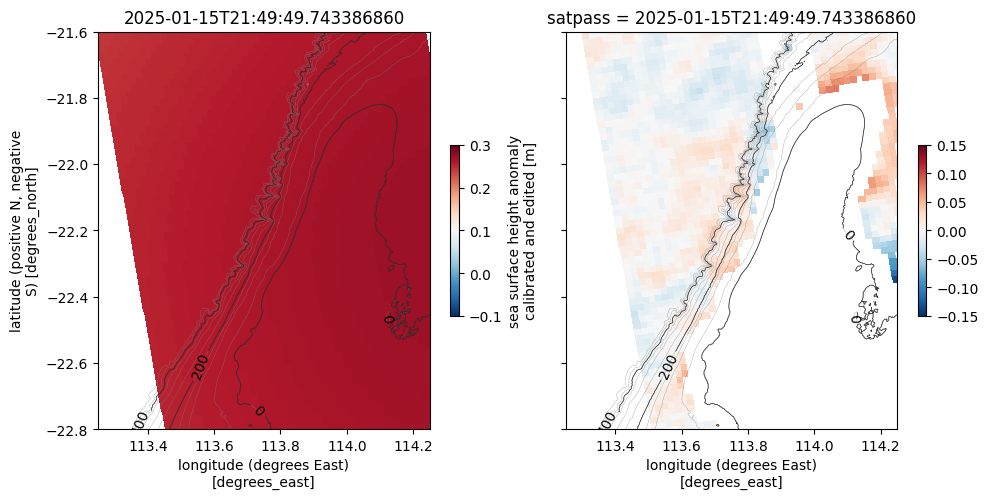

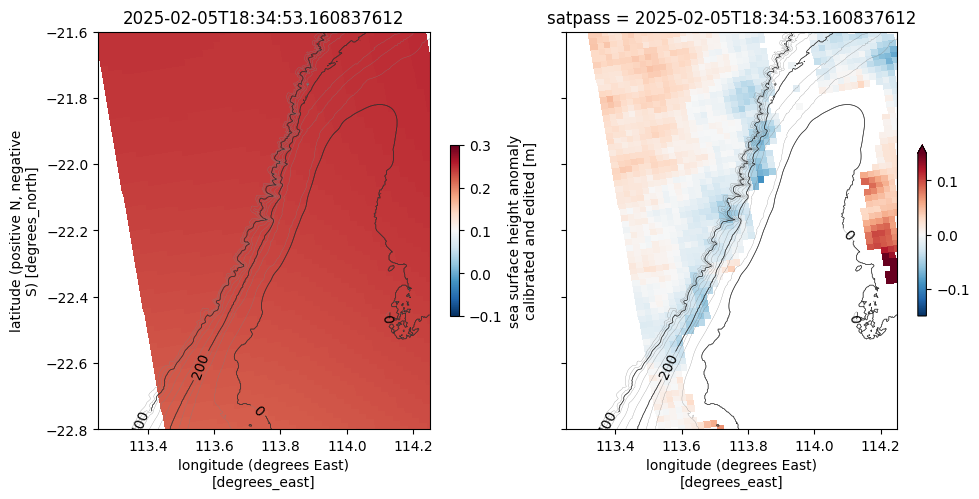

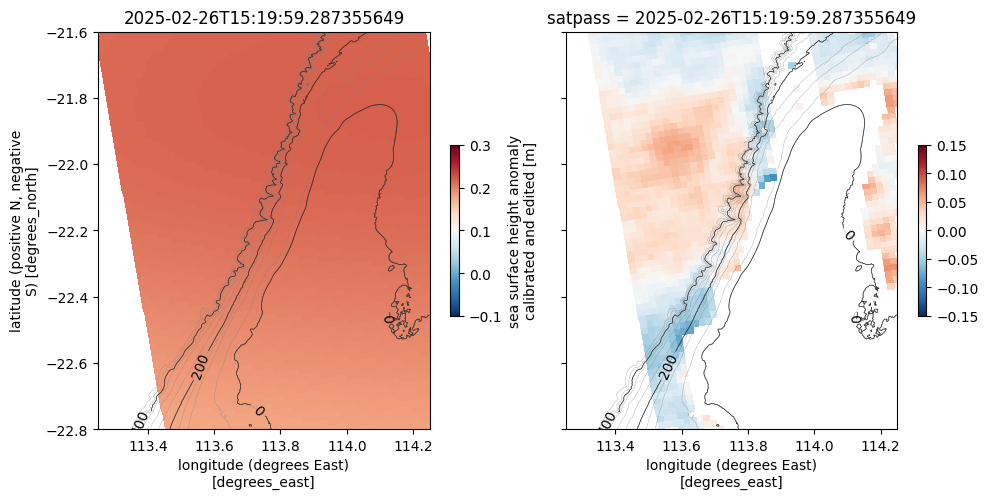

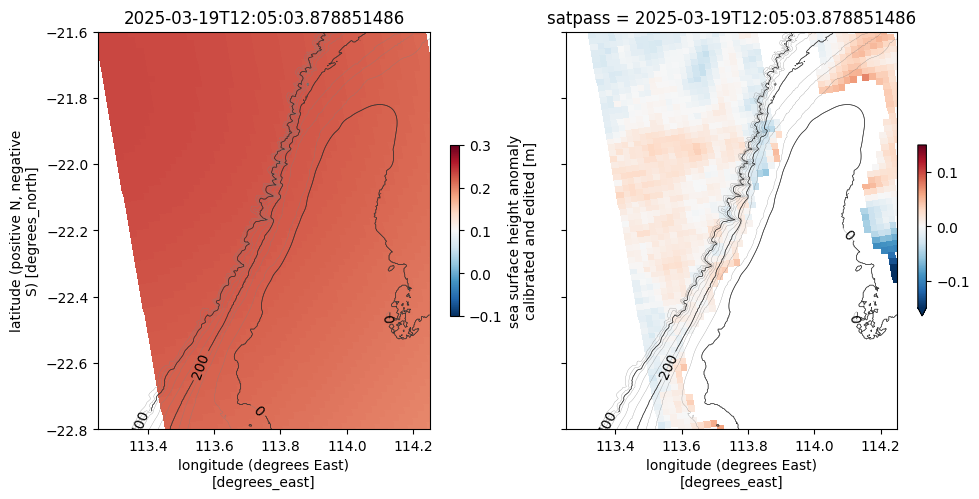

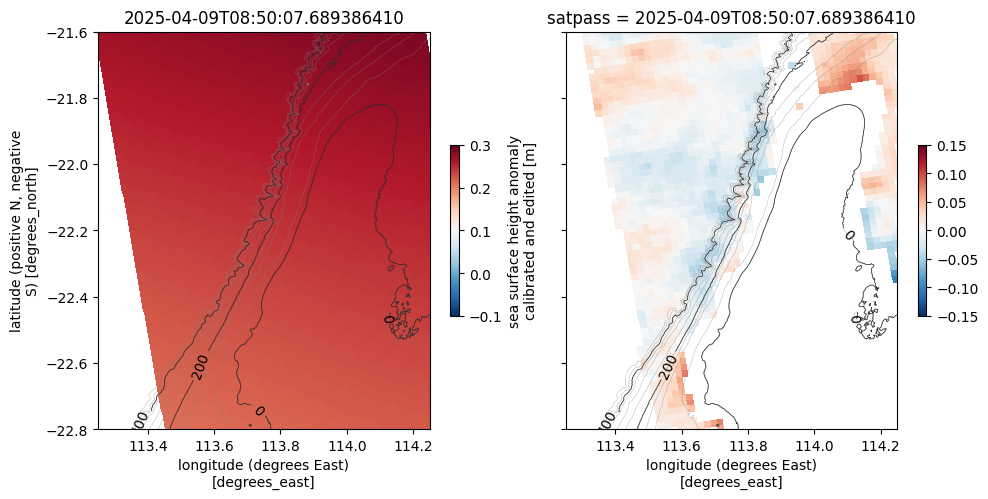

In [8]:
for ii in range(ds['satpass'].shape[0]):
    da1 = ds.isel(satpass=ii)[var1]
    da2 = ssh_meso_da.isel(satpass=ii)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,6))
    plot_kwargs = dict(
        x="longitude",
        y="latitude",
        cmap="RdBu_r",
        vmin=-0.1,
        vmax=0.3,
        cbar_kwargs={"shrink": 0.3},)
    da2.plot.pcolormesh(ax=ax1, **plot_kwargs)
    c=plot_basemap(ax1, (x1,x2), (y1,y2), clevs=[0,200,400], fine_contours=True)
    
    ax1.set_title(ds.satpass.values[ii])
    ax1.set_xlim(x1,x2)
    ax1.set_ylim(y1,y2)
    plt.clabel(c)
    
    ax1.set_aspect('equal')
    
    # mysst['sea_surface_temperature'].plot(ax=ax2, cmap='cmo.thermal',vmin=21+273, vmax=30+273,cbar_kwargs={"shrink": 0.3,})
    # ax2.pcolormesh(x,y,np.abs(dx+1j*dy), vmin=0, vmax=0.2, cmap='bone_r', alpha=0.5)
    # ax2.quiver(xs, ys, u, v, scale_units='xy', scale=10)
    
    c=plot_basemap(ax2, (x1,x2), (y1,y2), clevs=[0,200,400], fine_contours=True)
    plt.clabel(c)
    
    plot_kwargs = dict(
        x="longitude",
        y="latitude",
        cmap="RdBu_r",
        vmin=-0.15,
        vmax=0.15,
        cbar_kwargs={"shrink": 0.3},)
    (da1-da2).plot.pcolormesh(ax=ax2, **plot_kwargs)
    
    ax2.set_xlim(x1,x2)
    ax2.set_ylim(y1,y2)
    ax2.set_aspect('equal')
    ax2.set_ylabel('')
    ax2.set_yticklabels([])
    
    plt.tight_layout()
    
    outfile = '../FIGURES/SWOT_Karin_l3_{}_{}_{}_{}_mesoscale.png'.\
            format(version, satpass, region, ds.satpass.values[ii].astype(str)[0:10])
    
    plt.savefig(outfile, dpi=150)
    
    outfile

## Good Sentinel-3 coverage

pass 131:
- [April 11 2025](https://ovl.oceandatalab.com/?date=2025-04-10T12:00:00&timespan=1d&zoom=9&center=12650748.477112_-2550729.4510145&extent=12455069.684729_-2637409.0410778_12846427.269495_-2464049.8609512&products=3857_SAR_roughness!3857_ODYSSEA_REG_SST!3857_ODYSSEA_SST!3857_GlobCurrent_CMEMS_geostrophic_streamline!3857_AMSR_sea_ice_concentration!3857_Sentinel-3_SLSTR_SST&opacity=80_100_100_60_100_100&stackLevel=100.02_50.05_30.02_120.25_40.04_92.01&filter=+A,+B,+C,+IW,+EW,+SM,+WV,+VV,+HH!!!!!+A,+B&selection=000001)
- [October 26 2024](https://ovl.oceandatalab.com/?date=2024-10-26T12:00:00&timespan=1d&zoom=9&center=12650748.477112_-2550729.4510145&extent=12455069.684729_-2637409.0410778_12846427.269495_-2464049.8609512&products=3857_SAR_roughness!3857_ODYSSEA_REG_SST!3857_ODYSSEA_SST!3857_GlobCurrent_CMEMS_geostrophic_streamline!3857_AMSR_sea_ice_concentration!3857_Sentinel-3_SLSTR_SST&opacity=80_100_100_60_100_100&stackLevel=100.02_50.05_30.02_120.25_40.04_92.01&filter=+A,+B,+C,+IW,+EW,+SM,+WV,+VV,+HH!!!!!+A,+B&selection=000001)
- [September 15 2024](https://ovl.oceandatalab.com/?date=2024-09-15T12:00:00&timespan=1d&zoom=9&center=12625677.12626_-2556129.8939359&extent=12429998.333877_-2642809.4839992_12821355.918643_-2469450.3038726&products=3857_SAR_roughness!3857_ODYSSEA_REG_SST!3857_ODYSSEA_SST!3857_GlobCurrent_CMEMS_geostrophic_streamline!3857_AMSR_sea_ice_concentration!3857_Sentinel-3_SLSTR_SST&opacity=80_100_100_60_100_100&stackLevel=100.02_50.05_30.02_120.25_40.04_92.01&filter=+A,+B,+C,+IW,+EW,+SM,+WV,+VV,+HH!!!!!+A,+B&selection=000001)
- [August 24 2024](https://ovl.oceandatalab.com/?date=2024-08-24T12:00:00&timespan=1d&zoom=8&center=12565941.552406_-2556921.2957037&extent=12174583.96764_-2730280.4758303_12957299.137172_-2383562.1155771&products=3857_SAR_roughness!3857_ODYSSEA_REG_SST!3857_ODYSSEA_SST!3857_GlobCurrent_CMEMS_geostrophic_streamline!3857_AMSR_sea_ice_concentration!3857_Sentinel-3_SLSTR_SST&opacity=80_100_100_60_100_100&stackLevel=100.02_50.05_30.02_120.25_40.04_92.01&filter=+A,+B,+C,+IW,+EW,+SM,+WV,+VV,+HH!!!!!+A,+B&selection=000001)
- [August 4 2024](https://ovl.oceandatalab.com/?date=2024-08-04T12:00:00&timespan=1d&zoom=8&center=12622199.202427_-2567639.0214405&extent=12230841.617661_-2740998.2015671_13013556.787193_-2394279.8413139&products=3857_SAR_roughness!3857_ODYSSEA_REG_SST!3857_ODYSSEA_SST!3857_GlobCurrent_CMEMS_geostrophic_streamline!3857_AMSR_sea_ice_concentration!3857_Sentinel-3_SLSTR_SST&opacity=80_100_100_60_100_100&stackLevel=100.02_50.05_30.02_120.25_40.04_92.01&filter=+A,+B,+C,+IW,+EW,+SM,+WV,+VV,+HH!!!!!+A,+B&selection=000001)
- [July 14 2024](https://ovl.oceandatalab.com/?date=2024-07-14T12:00:00&timespan=1d&zoom=8&center=12622199.202427_-2567639.0214405&extent=12230841.617661_-2740998.2015671_13013556.787193_-2394279.8413139&products=3857_SAR_roughness!3857_ODYSSEA_REG_SST!3857_ODYSSEA_SST!3857_GlobCurrent_CMEMS_geostrophic_streamline!3857_AMSR_sea_ice_concentration!3857_Sentinel-3_SLSTR_SST&opacity=80_100_100_60_100_100&stackLevel=100.02_50.05_30.02_120.25_40.04_92.01&filter=+A,+B,+C,+IW,+EW,+SM,+WV,+VV,+HH!!!!!+A,+B&selection=000001)
- [May 12 2024](https://ovl.oceandatalab.com/?date=2024-05-12T12:00:00&timespan=1d&zoom=8&center=12622199.202427_-2567639.0214405&extent=12230841.617661_-2740998.2015671_13013556.787193_-2394279.8413139&products=3857_SAR_roughness!3857_ODYSSEA_REG_SST!3857_ODYSSEA_SST!3857_GlobCurrent_CMEMS_geostrophic_streamline!3857_AMSR_sea_ice_concentration!3857_Sentinel-3_SLSTR_SST&opacity=80_100_100_60_100_100&stackLevel=100.02_50.05_30.02_120.25_40.04_92.01&filter=+A,+B,+C,+IW,+EW,+SM,+WV,+VV,+HH!!!!!+A,+B&selection=000001)
- [January 29 2024](https://ovl.oceandatalab.com/?date=2024-01-29T12:00:00&timespan=1d&zoom=8&center=12624033.685527_-2544260.7908257&extent=12232676.100761_-2717619.9709523_13015391.270293_-2370901.6106991&products=3857_SAR_roughness!3857_ODYSSEA_REG_SST!3857_ODYSSEA_SST!3857_GlobCurrent_CMEMS_geostrophic_streamline!3857_AMSR_sea_ice_concentration!3857_Sentinel-3_SLSTR_SST&opacity=80_100_100_60_100_100&stackLevel=100.02_50.05_30.02_120.25_40.04_92.01&filter=+A,+B,+C,+IW,+EW,+SM,+WV,+VV,+HH!!!!!+A,+B&selection=000001)
- [October 18 2023](https://ovl.oceandatalab.com/?date=2023-10-18T12:00:00&timespan=1d&zoom=8&center=12604160.052598_-2526683.3317719&extent=12212802.467832_-2700042.5118985_12995517.637364_-2353324.1516453&products=3857_SAR_roughness!3857_ODYSSEA_REG_SST!3857_ODYSSEA_SST!3857_GlobCurrent_CMEMS_geostrophic_streamline!3857_AMSR_sea_ice_concentration!3857_Sentinel-3_SLSTR_SST&opacity=80_100_100_60_100_100&stackLevel=100.02_50.05_30.02_120.25_40.04_92.01&filter=+A,+B,+C,+IW,+EW,+SM,+WV,+VV,+HH!!!!!+A,+B&selection=000001)
- [September 6 2023](https://ovl.oceandatalab.com/?date=2023-09-06T12:00:00&timespan=1d&zoom=8&center=12601102.560311_-2548357.7222453&extent=12209744.975545_-2721716.9023719_12992460.145077_-2374998.5421187&products=3857_SAR_roughness!3857_ODYSSEA_REG_SST!3857_ODYSSEA_SST!3857_GlobCurrent_CMEMS_geostrophic_streamline!3857_AMSR_sea_ice_concentration!3857_Sentinel-3_SLSTR_SST&opacity=80_100_100_60_100_100&stackLevel=100.02_50.05_30.02_120.25_40.04_92.01&filter=+A,+B,+C,+IW,+EW,+SM,+WV,+VV,+HH!!!!!+A,+B&selection=000001)

pass 062:
- [April 10 2025](https://ovl.oceandatalab.com/?date=2025-04-10T12:00:00&timespan=1d&zoom=8&center=12601102.560311_-2548357.7222453&extent=12209744.975545_-2721716.9023719_12992460.145077_-2374998.5421187&products=3857_SAR_roughness!3857_ODYSSEA_REG_SST!3857_ODYSSEA_SST!3857_GlobCurrent_CMEMS_geostrophic_streamline!3857_AMSR_sea_ice_concentration!3857_Sentinel-3_SLSTR_SST&opacity=80_100_100_60_100_100&stackLevel=100.02_50.05_30.02_120.25_40.04_92.01&filter=+A,+B,+C,+IW,+EW,+SM,+WV,+VV,+HH!!!!!+A,+B&selection=000001)
- [February 5 2025](https://ovl.oceandatalab.com/?date=2025-02-05T12:00:00&timespan=1d&zoom=8&center=12601102.560311_-2548357.7222453&extent=12209744.975545_-2721716.9023719_12992460.145077_-2374998.5421187&products=3857_SAR_roughness!3857_ODYSSEA_REG_SST!3857_ODYSSEA_SST!3857_GlobCurrent_CMEMS_geostrophic_streamline!3857_AMSR_sea_ice_concentration!3857_Sentinel-3_SLSTR_SST&opacity=80_100_100_60_100_100&stackLevel=100.02_50.05_30.02_120.25_40.04_92.01&filter=+A,+B,+C,+IW,+EW,+SM,+WV,+VV,+HH!!!!!+A,+B&selection=000001)
- [December 26 2024](https://ovl.oceandatalab.com/?date=2024-12-26T12:00:00&timespan=1d&zoom=8&center=12546373.642489_-2554939.9326416&extent=12155016.057723_-2728299.1127682_12937731.227255_-2381580.752515&products=3857_SAR_roughness!3857_ODYSSEA_REG_SST!3857_ODYSSEA_SST!3857_GlobCurrent_CMEMS_geostrophic_streamline!3857_AMSR_sea_ice_concentration!3857_Sentinel-3_SLSTR_SST&opacity=80_100_100_60_100_100&stackLevel=100.02_50.05_30.02_120.25_40.04_92.01&filter=+A,+B,+C,+IW,+EW,+SM,+WV,+VV,+HH!!!!!+A,+B&selection=000001)
- [December 5 2024](https://ovl.oceandatalab.com/?date=2024-12-05T12:00:00&timespan=1d&zoom=8&center=12546373.642489_-2554939.9326416&extent=12155016.057723_-2728299.1127682_12937731.227255_-2381580.752515&products=3857_SAR_roughness!3857_ODYSSEA_REG_SST!3857_ODYSSEA_SST!3857_GlobCurrent_CMEMS_geostrophic_streamline!3857_AMSR_sea_ice_concentration!3857_Sentinel-3_SLSTR_SST&opacity=80_100_100_60_100_100&stackLevel=100.02_50.05_30.02_120.25_40.04_92.01&filter=+A,+B,+C,+IW,+EW,+SM,+WV,+VV,+HH!!!!!+A,+B&selection=000001)
- TBC...
